<a href="https://colab.research.google.com/github/SebastianNewberry/Intro_LLM_Homework_1/blob/main/seq2seq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework #1 CSC 5991 by Sebastian, Parth, Endri

## Creating the Vocabulary Class for Tokenization of Characters

In [18]:
#location of the data
data_location =  "./"

In [19]:
#If using colab to download assets:

from google.colab import drive
drive.mount('/content/drive')

!7z e "/content/drive/MyDrive/Images.zip" -o"/content/Images"
!cp "/content/drive/MyDrive/captions.txt" "/content/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,12 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (50657),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/                                 1 file, 1112364363 bytes (1061 MiB)

Extracting archive: /content/drive/MyDrive/Images.zip
 50% 4096 Open              --
Path = /content/drive/MyDrive/Images.zip
Type = zip
Physical Size = 1112364363

  0%    
Would you like to replace the existing file:
  Path:     /content/Images/1000268201_693b08cb0e.jpg
  Size:     199606 bytes (195 KiB)
  Modified: 2025-02-08 00:31:21
with the file from archive:
  Path:     Images/1000268201_693b08cb0e.jpg
  Size:     199606 by

In [20]:
#reading the text data
import pandas as pd
caption_file = data_location + '/captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

There are 40455 image to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


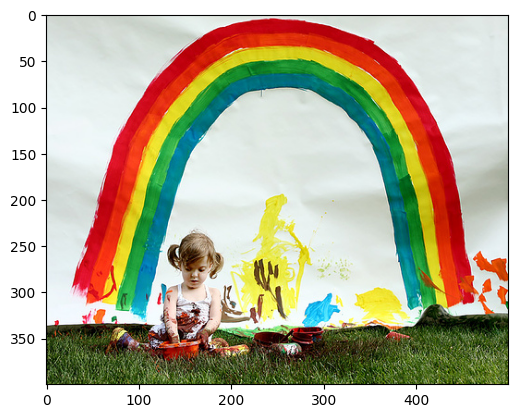

Caption: A little girl is sitting in front of a large painted rainbow .
Caption: A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .
Caption: There is a girl with pigtails sitting in front of a rainbow painting .
Caption: Young girl with pigtails painting outside in the grass .
Caption: A man lays on a bench while his dog sits by him .


In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#select any index from the whole dataset
#single image has 5 captions
#so, select indx as: 1,6,11,16...
data_idx = 11

#eg path to be plot: ../input/flickr8k/Images/1000268201_693b08cb0e.jpg
image_path = data_location+"/Images/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()

#image consists of 5 captions,
#showing all 5 captions of the image of the given idx
for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])

In [22]:
import spacy

#using spacy for the better text tokenization
!python -m spacy download en_core_web_lg
spacy_eng = spacy.load("en_core_web_lg")

#example
text = "This is a good place to find a city"
[token.text.lower() for token in spacy_eng.tokenizer(text)]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


/usr/local/lib/python3.11/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


['this', 'is', 'a', 'good', 'place', 'to', 'find', 'a', 'city']

## Vocabulary Class

In [23]:
class Vocabulary:
    def __init__(self,freq_threshold):
        #setting the pre-reserved tokens int to string tokens
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}

        #string to int tokens
        #its reverse dict self.itos
        self.stoi = {v:k for k,v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self): return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]

    def build_vocab(self, sentence_list):
        frequencies = {}
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] = frequencies.get(word, 0) + 1

                #add the word to the vocab if it reaches minimum frequecy threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self,text):
        """ For each word in the text corresponding index token for that word form the vocab built as list """
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]

In [24]:
#testing the vocab class
v = Vocabulary(freq_threshold=1)

v.build_vocab(["This is a good place to find a city"])
print(v.stoi)
print(v.numericalize("This is a good place to find a city here!!"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'this': 4, 'is': 5, 'a': 6, 'good': 7, 'place': 8, 'to': 9, 'find': 10, 'city': 11}
[4, 5, 6, 7, 8, 9, 10, 6, 11, 3, 3, 3]


## Flickr Dataset

In [25]:
from torch.utils.data import DataLoader,Dataset
import os
import torch

class FlickrDataset(Dataset):
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        self.root_dir = root_dir

        # Check if captions_file is a string (file path) or a DataFrame
        if isinstance(captions_file, str):
            self.df = pd.read_csv(captions_file)  # Read from file if it's a path
        elif isinstance(captions_file, pd.DataFrame):
            self.df = captions_file  # Directly use the dataframe if passed
        else:
            raise TypeError("captions_file must be either a string (file path) or a DataFrame.")

        self.transform = transform

        # Get unique image names
        self.unique_images = self.df["image"].unique()

        # Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.df["caption"].tolist())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row["image"]
        caption = row["caption"]

        img_location = os.path.join(self.root_dir, img_name)
        img = Image.open(img_location).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        # Numericalize the caption text
        caption_vec = [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

## Caps Collate

In [26]:
from torch.nn.utils.rnn import pad_sequence

class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    """
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

## Helper Functions to Plot Tensor Image

In [27]:
import torchvision.transforms as T

#defing the transform to be applied
transforms = T.Compose([
    T.Resize(226),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])

In [28]:
#show the tensor image
import matplotlib.pyplot as plt

def show_image(img, title=None):
    """Imshow for Tensor."""

    #unnormalize
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))


    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

## Implement a Train and a Test Dataset

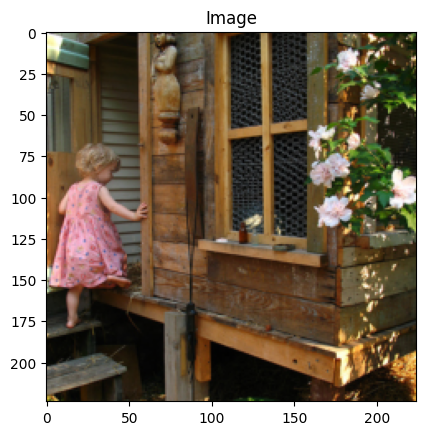

Token: tensor([  1,   4,  28,   8,   4, 156, 224,  17,  32,  61,   4, 297,  11, 613,
          8,  24,   3, 425,   5,   2])
Sentence:
['<SOS>', 'a', 'child', 'in', 'a', 'walking', 'traffic', 'is', 'climbing', 'young', 'a', 'picnic', 'of', 'diver', 'in', 'an', '<UNK>', 'forest', '.', '<EOS>']


In [29]:
from PIL import Image
from sklearn.model_selection import train_test_split
#testing the dataset class
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)

# For the following steps I used CHATGPT to help me generate a way to split the dataset without separating images from their captions.
# Since every image has 5 captions, I wanted to make sure that a single image was either included in the training or testing dataset
# with its captions. I didn't want to split the captions up and have the same image in both datasets.

# Get unique image names
unique_images = dataset.df["image"].unique()

# Split at the image level (not caption level)
train_images, val_images = train_test_split(unique_images, test_size=0.2, random_state=42)

# Filter dataset to create train and validation subsets
train_df = dataset.df[dataset.df["image"].isin(train_images)]
val_df = dataset.df[dataset.df["image"].isin(val_images)]

# Create dataset objects for train and validation sets
train_dataset = FlickrDataset(root_dir= data_location+"/Images", captions_file=train_df, transform=transforms)
val_dataset = FlickrDataset(root_dir= data_location+"/Images", captions_file=val_df, transform=transforms)


img, caps = train_dataset[0]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

## Initiate Dataset and Dataloader

In [30]:
#writing the dataloader
#setting the constants
BATCH_SIZE = 256
NUM_WORKER = 1

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

# We will initialize the data loader later when we create datasets with different batch sizes to show how batch size affects performance. See the "Train the Model" heading.

# data_loader = DataLoader(
#     dataset=dataset,
#     batch_size=BATCH_SIZE,
#     num_workers=NUM_WORKER,
#     shuffle=True,
#     collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
# )

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Defining the Model Architecture

## Encoder

In [31]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)

        # Uses all parts of the resnet except avg pooling and fully connected layer
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)


    def forward(self, images):
        features = self.resnet(images)                                    #(batch_size,2048,7,7)
        features = features.permute(0, 2, 3, 1)                           #(batch_size,7,7,2048)
        features = features.view(features.size(0), -1, features.size(-1)) #(batch_size,49,2048)
        return features

#Bahdanau Attention
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()

        self.attention_dim = attention_dim

        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)

        self.A = nn.Linear(attention_dim,1)




    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)

        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attention_dim)

        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)


        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)

        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,features_dim)

        return alpha,attention_weights


## Decoder

In [32]:
#Attention Decoder
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()

        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim

        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)


        #init_h and init_c are only meant to initialize the first hidden state and context vector, then every vector after that will use attention with an lstm.

        # Since the initial state focuses on the entire picture, and doesn't focus on any spacial locality, it becomes more likely to see generic articles or common words as the first word in a sentence
        # because it
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)

        #LSTM will be a combination of the previous embedding (the character that was generated just before the current character (st - 1)) and also the context vector which has a dimension of encoder_dim
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)


        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)



    def forward(self, features, captions):

        #vectorize the caption
        embeds = self.embedding(captions)

        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)

        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)

        for s in range(seq_length):
            alpha,context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))

            output = self.fcn(self.drop(h))

            preds[:,s] = output
            alphas[:,s] = alpha


        return preds, alphas

    def generate_caption(self,features,max_len=20,vocab=None):
        # Inference part
        # Given the image features generate the captions

        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        alphas = []

        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)


        captions = []

        for i in range(max_len):
            alpha,context = self.attention(features, h)


            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())

            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)


            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)

            #save the generated word
            captions.append(predicted_word_idx.item())

            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break

            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))

        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas


    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c



## Set up the Process to Call Both the Encoder and Decoder

In [33]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

## Setting Initial Hyperparameters

In [34]:
#Hyperparams
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4
BATCH_SIZE = 256
NUM_WORKER = 1

## Initializing the Model

In [ ]:
model = None

## Saving the Model

In [35]:
#helper function to save the model
# def save_model(model,num_epochs):
#     model_state = {
#         'num_epochs':num_epochs,
#         'embed_size':embed_size,
#         'vocab_size':len(dataset.vocab),
#         'attention_dim':attention_dim,
#         'encoder_dim':encoder_dim,
#         'decoder_dim':decoder_dim,
#         'state_dict':model.state_dict()
#     }

#     torch.save(model_state,'attention_model_state_large.pth')

## Training the Model While Varying the Hyperparameters

In [38]:
# Varying Batch Size:

num_epochs = 10
print_every = 10

# Track losses for visualization

batch_losses = {}

for batch in (128, 256, 512, 1024):

  #init model
  model = EncoderDecoder(
  embed_size=embed_size,
  vocab_size = vocab_size,
  attention_dim=attention_dim,
  encoder_dim=encoder_dim,
  decoder_dim=decoder_dim).to(device)

  criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)

  epoch_losses = []

  data_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch,
    num_workers=1,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
  )

  for epoch in range(1,num_epochs+1):

    total_loss = 0

    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs,attentions = model(image, captions)

        # Calculate the batch loss.
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

        #Add the current loss to the total
        total_loss += loss.item()

        if (idx+1)%print_every == 0:
            print(f"Epoch: {epoch} loss: {loss.item():.5f} Learning Rate {learning_rate * i}")


            #generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(data_loader)
                img,_ = next(dataiter)
                features = model.encoder(img[0:1].to(device))
                caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0],title=caption)

            model.train()

      # Compute average loss for this epoch
    avg_loss = total_loss / len(data_loader)
    epoch_losses.append((epoch, avg_loss))

    print(f"Epoch {epoch} Average Loss: {avg_loss:.5f}")

  batch_losses[batch] = epoch_losses









# Varying Learning Rate:

num_epochs = 10
print_every = 10

# Track losses for visualization

learning_rate_losses = {}

for i in range(1, 5):

  #init model
  model = EncoderDecoder(
  embed_size=embed_size,
  vocab_size = vocab_size,
  attention_dim=attention_dim,
  encoder_dim=encoder_dim,
  decoder_dim=decoder_dim).to(device)

  criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
  optimizer = optim.Adam(model.parameters(), lr=learning_rate * i)

  epoch_losses = []

  data_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch,
    num_workers=1,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
  )

  for epoch in range(1,num_epochs+1):

    total_loss = 0

    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs,attentions = model(image, captions)

        # Calculate the batch loss.
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

        #Add the current loss to the total
        total_loss += loss.item()

        if (idx+1)%print_every == 0:
            print(f"Epoch: {epoch} loss: {loss.item():.5f} Batch {(idx + 1) / len(data_loader)}")


            #generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(data_loader)
                img,_ = next(dataiter)
                features = model.encoder(img[0:1].to(device))
                caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0],title=caption)

            model.train()

      # Compute average loss for this epoch
    avg_loss = total_loss / len(data_loader)
    epoch_losses.append((epoch, avg_loss))

    print(f"Epoch {epoch} Average Loss: {avg_loss:.5f}")

  learning_rate_losses[learning_rate * i] = epoch_losses

# #save the latest model
# save_model(model,num_epochs)

Epoch 1 Average Loss: 5.09690
Epoch 2 Average Loss: 4.18814
Epoch 1 Average Loss: 5.59799
Epoch 2 Average Loss: 4.58602


# Graphing Our Results

{512: [(1, 5.096899442374706), (2, 4.188139770179987)], 1024: [(1, 5.5979940593242645), (2, 4.58602499961853)]}


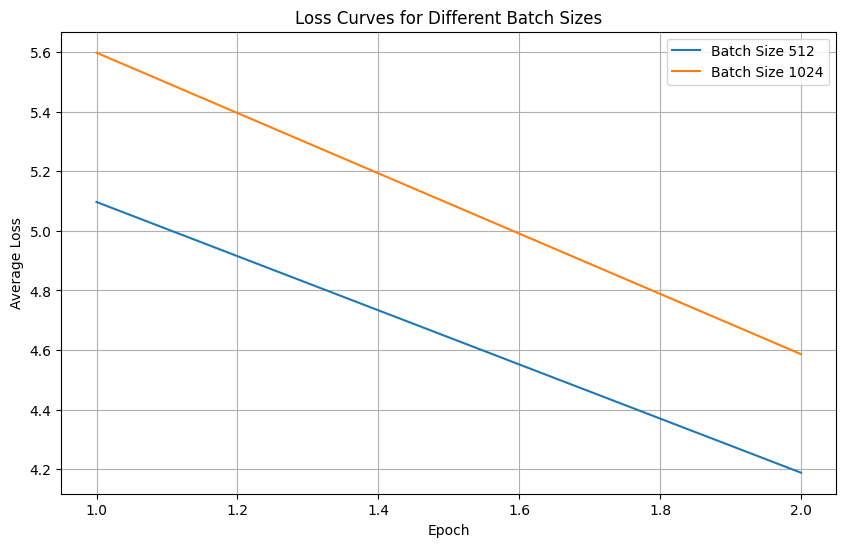

In [44]:
import matplotlib.pyplot as plt

def plot_batch_loss_curves(batch_losses):
    """
    Plots loss curves for different batch sizes.

    :param batch_losses: Dictionary with batch_size as keys and lists of epoch losses as values.
    """
    plt.figure(figsize=(10, 6))

    for batch_size, losses in batch_losses.items():
        epochs = [epoch for epoch, loss in losses]
        loss_values = [loss for epoch, loss in losses]

        # Plot the loss curve for each batch size
        plt.plot(epochs, loss_values, label=f"Batch Size {batch_size}")

    plt.xlabel("Epoch")
    plt.ylabel("Average Loss")
    plt.title("Loss Curves for Different Batch Sizes")
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_learning_rate_loss_curves(learning_rate_losses):
    """
    Plots loss curves for different batch sizes.

    :param batch_losses: Dictionary with batch_size as keys and lists of epoch losses as values.
    """
    plt.figure(figsize=(10, 6))

    for lr, losses in learning_rate_losses.items():
        epochs = [epoch for epoch, loss in losses]
        loss_values = [loss for epoch, loss in losses]

        # Plot the loss curve for each batch size
        plt.plot(epochs, loss_values, label=f"Learning Rate {lr}")

    plt.xlabel("Epoch")
    plt.ylabel("Average Loss")
    plt.title("Loss Curves for Different Batch Sizes")
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the function to plot losses
plot_batch_loss_curves(batch_losses)

## Initialized a Model for Validation

Now that we have finished testing different hyperparameters, we can create hyperparameters for our validation model

In [47]:
  #init model
model = EncoderDecoder(
embed_size=embed_size,
vocab_size = vocab_size,
attention_dim=attention_dim,
encoder_dim=encoder_dim,
decoder_dim=decoder_dim).to(device)
BATCH_SIZE = 256
learning_rate = 3e-4

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

## Train the Model with Optimal Hyperparams for the Validation Dataset

Up until now, we have only used 80% of the data of the dataset for training, now we will run through the last 20% for validation

Epoch: 1 loss: 4.22760


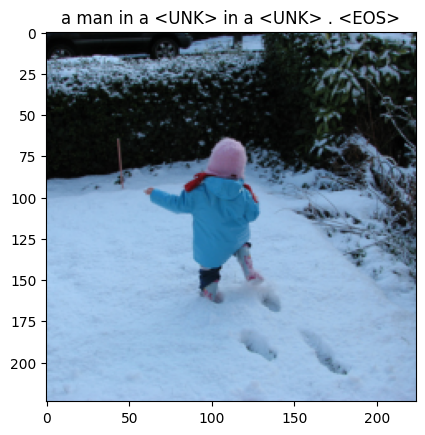

Epoch 1 Average Loss: 4.29979
Epoch: 2 loss: 3.56684


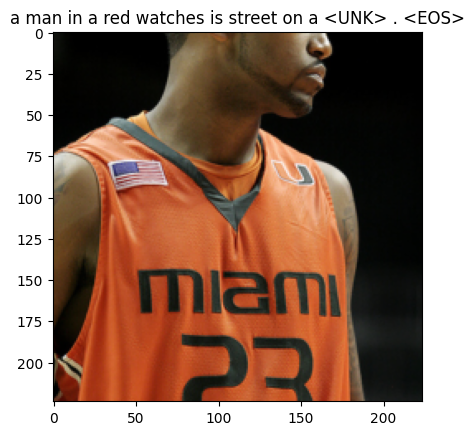

Epoch 2 Average Loss: 3.66874


In [53]:
# Varying Batch Size:

num_epochs = 2
print_every = 70

# Track losses for visualization

epoch_losses = []

data_loader = DataLoader(
  dataset=train_dataset,
  batch_size= BATCH_SIZE,
  num_workers=1,
  shuffle=True,
  collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

for epoch in range(1,num_epochs+1):

  total_loss = 0

  for idx, (image, captions) in enumerate(iter(data_loader)):
      image,captions = image.to(device),captions.to(device)

      # Zero the gradients.
      optimizer.zero_grad()

      # Feed forward
      outputs,attentions = model(image, captions)

      # Calculate the batch loss.
      targets = captions[:,1:]
      loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

      # Backward pass.
      loss.backward()

      # Update the parameters in the optimizer.
      optimizer.step()

      #Add the current loss to the total
      total_loss += loss.item()

      if (idx+1)%print_every == 0:
          print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))


          #generate the caption
          model.eval()
          with torch.no_grad():
              dataiter = iter(data_loader)
              img,_ = next(dataiter)
              features = model.encoder(img[0:1].to(device))
              caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
              caption = ' '.join(caps)
              show_image(img[0],title=caption)

          model.train()

    # Compute average loss for this epoch
  avg_loss = total_loss / len(data_loader)
  epoch_losses.append((epoch, avg_loss))

  print(f"Epoch {epoch} Average Loss: {avg_loss:.5f}")

# #save the latest model
# save_model(model,num_epochs)

## Run the Model Through the Validation Dataset

Epoch: 1 Batch 10/8095 loss: 6.24697


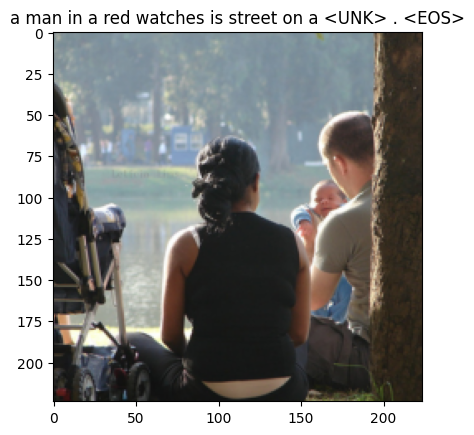

Epoch: 1 Batch 20/8095 loss: 5.54428


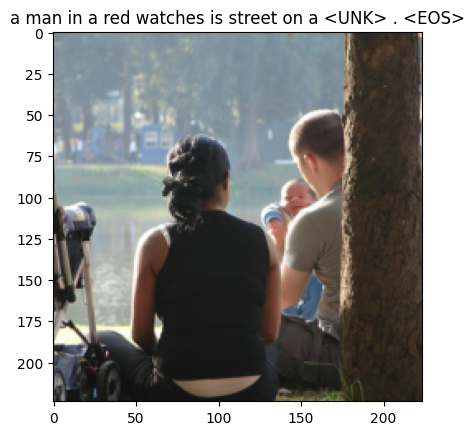

Epoch: 1 Batch 30/8095 loss: 6.93105


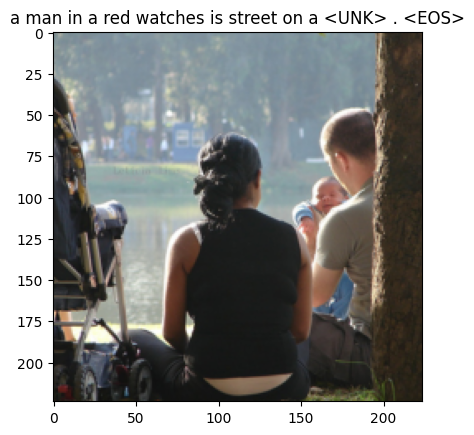

Epoch: 1 Batch 40/8095 loss: 5.45088


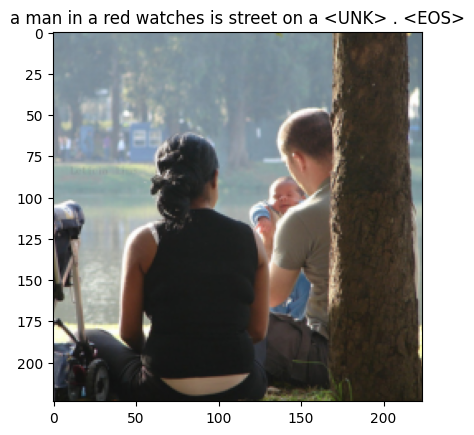

Epoch: 1 Batch 50/8095 loss: 4.15600


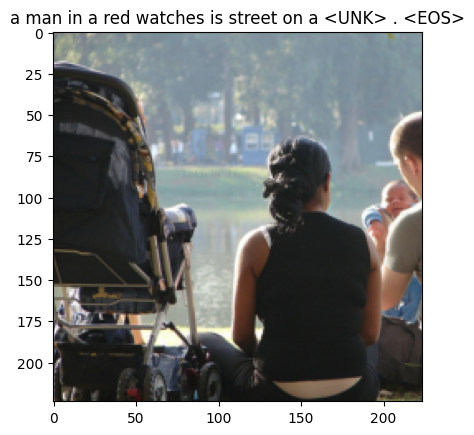

Epoch: 1 Batch 60/8095 loss: 4.10582


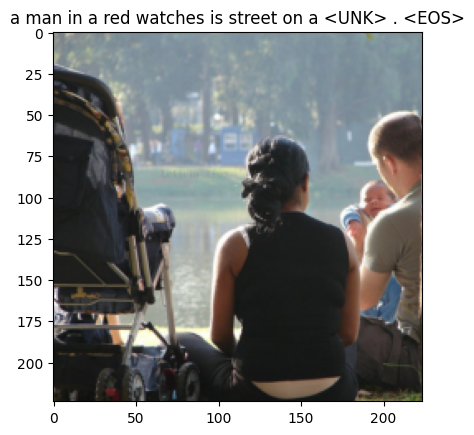

Epoch: 1 Batch 70/8095 loss: 6.13418


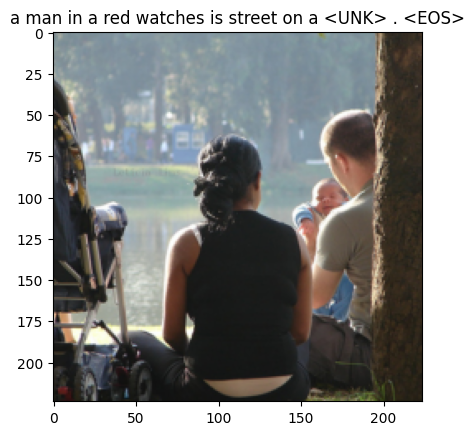

Epoch: 1 Batch 80/8095 loss: 4.56220


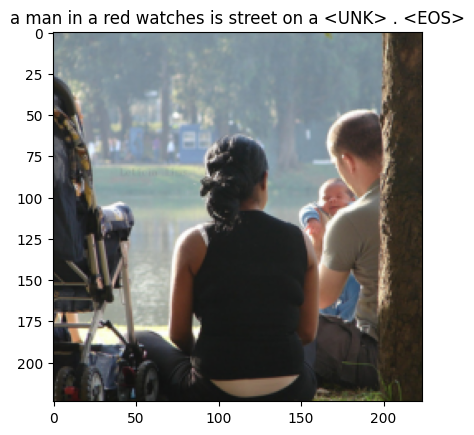

Epoch: 1 Batch 90/8095 loss: 5.05519


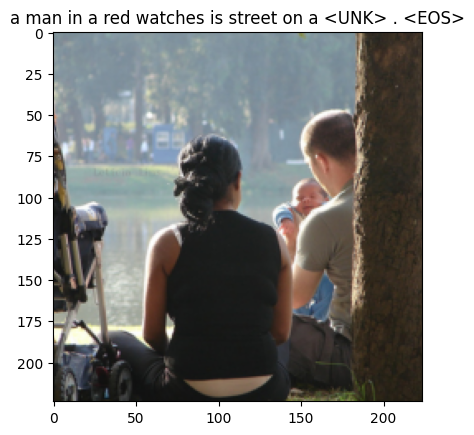

Epoch: 1 Batch 100/8095 loss: 5.64737


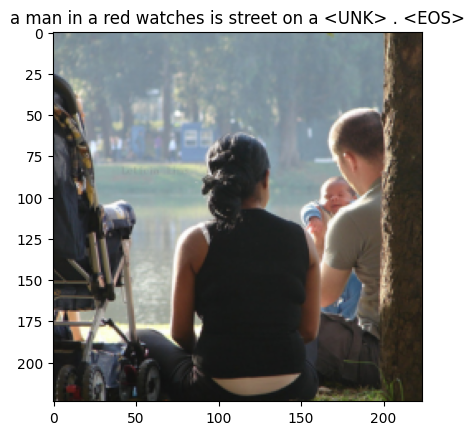

Epoch: 1 Batch 110/8095 loss: 5.45362


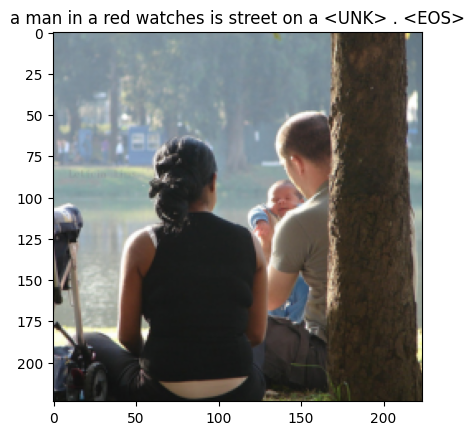

Epoch: 1 Batch 120/8095 loss: 5.41792


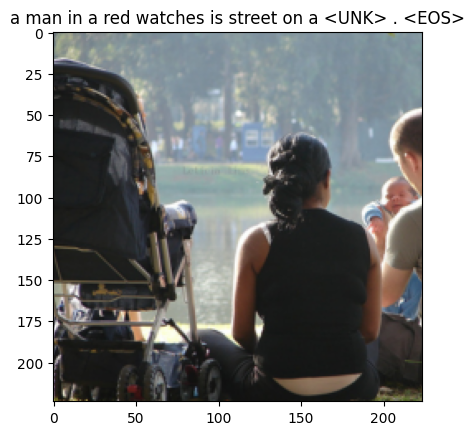

Epoch: 1 Batch 130/8095 loss: 4.81709


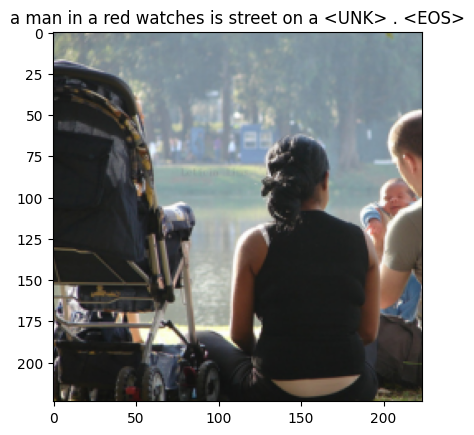

Epoch: 1 Batch 140/8095 loss: 4.99663


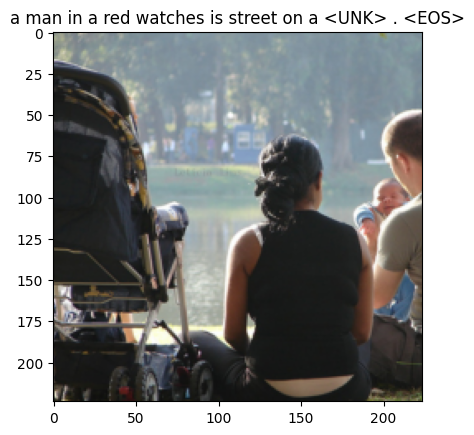

Epoch: 1 Batch 150/8095 loss: 4.82530


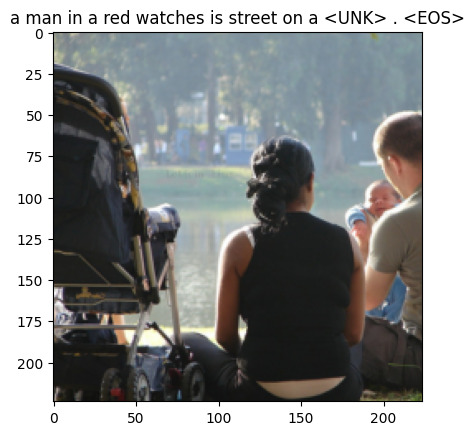

Epoch: 1 Batch 160/8095 loss: 6.12334


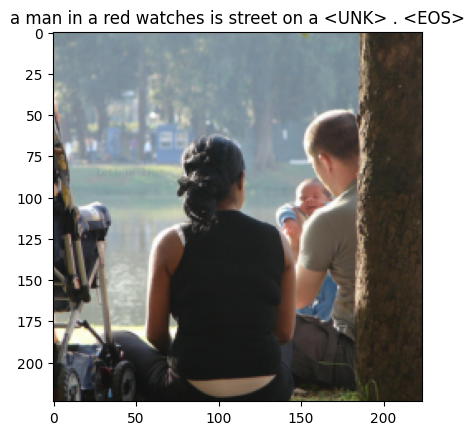

Epoch: 1 Batch 170/8095 loss: 5.27810


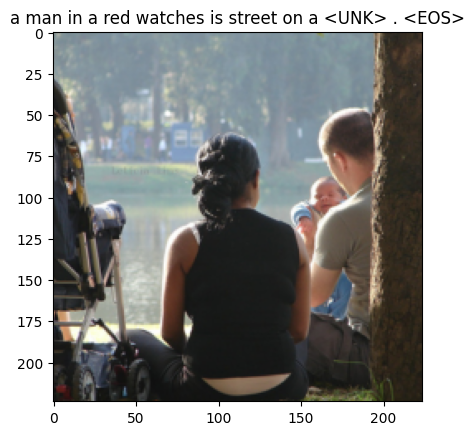

Epoch: 1 Batch 180/8095 loss: 4.60001


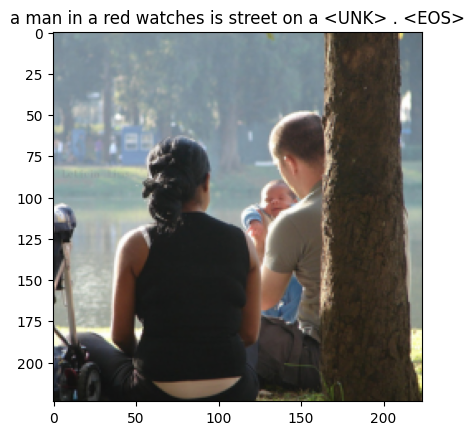

Epoch: 1 Batch 190/8095 loss: 6.32699


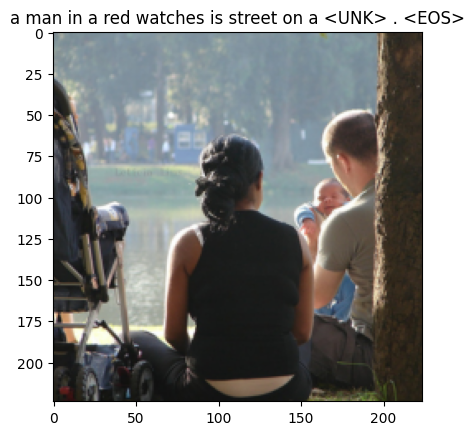

Epoch: 1 Batch 200/8095 loss: 5.33635


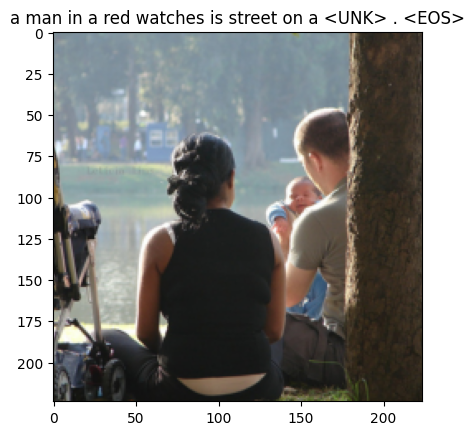

Epoch: 1 Batch 210/8095 loss: 5.04754


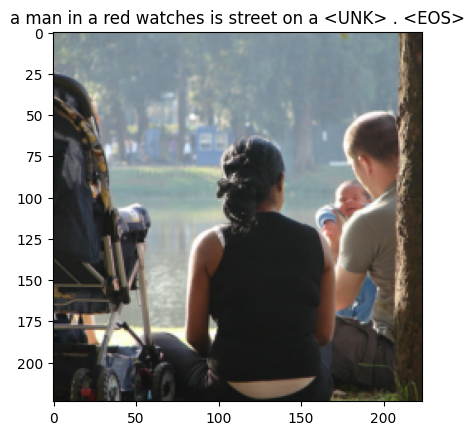

Epoch: 1 Batch 220/8095 loss: 5.70953


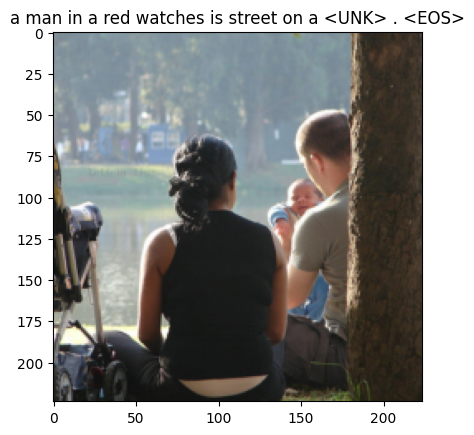

Epoch: 1 Batch 230/8095 loss: 4.23386


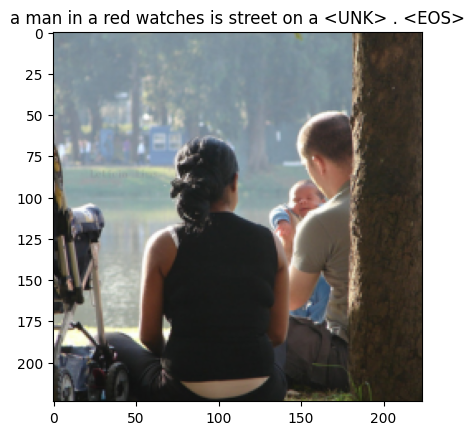

Epoch: 1 Batch 240/8095 loss: 5.41487


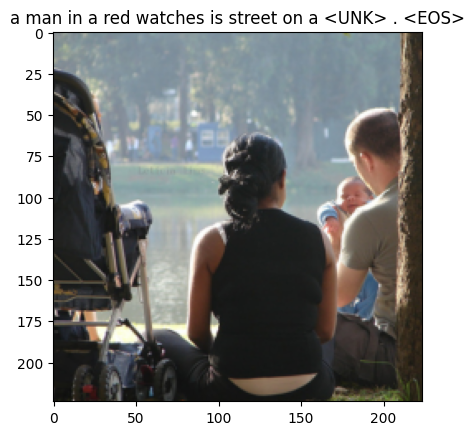

Epoch: 1 Batch 250/8095 loss: 5.84986


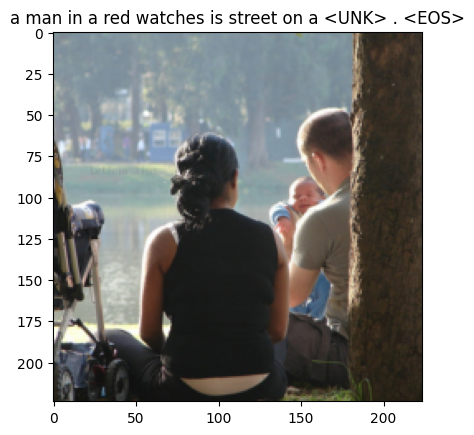

Epoch: 1 Batch 260/8095 loss: 5.33294


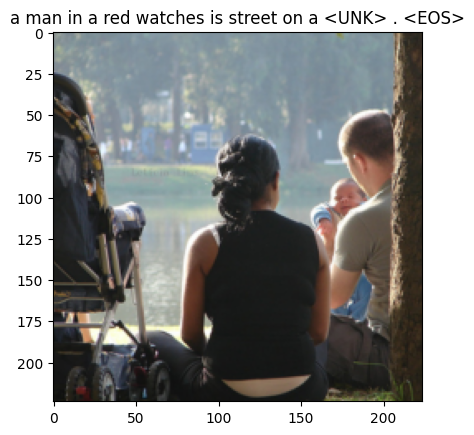

Epoch: 1 Batch 270/8095 loss: 5.86185


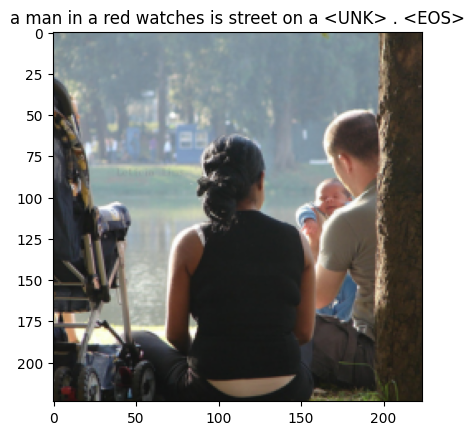

Epoch: 1 Batch 280/8095 loss: 4.59211


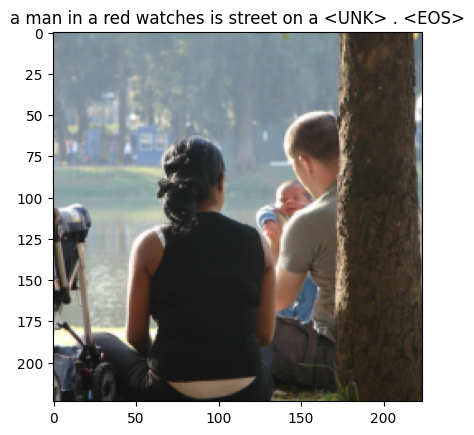

Epoch: 1 Batch 290/8095 loss: 3.37940


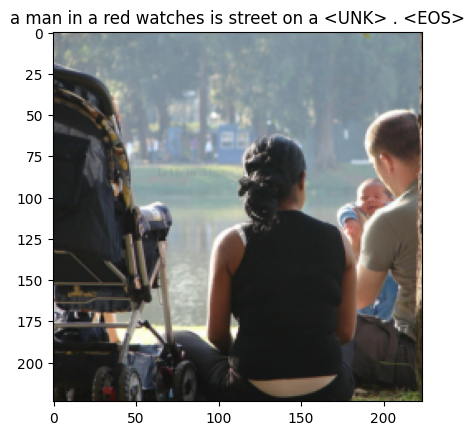

Epoch: 1 Batch 300/8095 loss: 5.08143


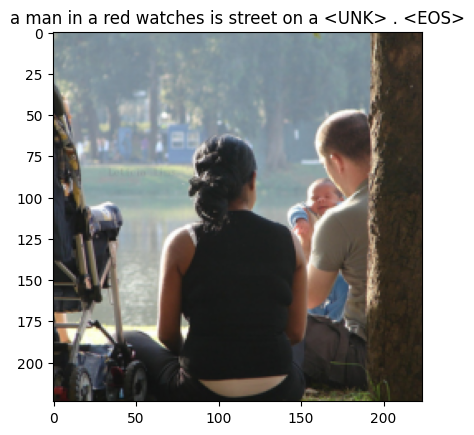

Epoch: 1 Batch 310/8095 loss: 5.37498


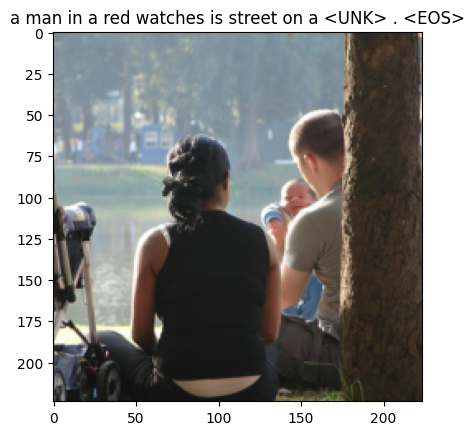

Epoch: 1 Batch 320/8095 loss: 4.55263


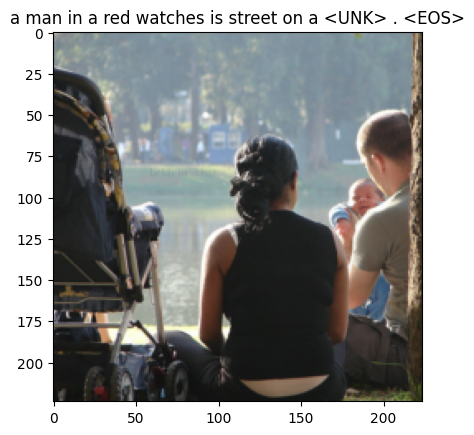

Epoch: 1 Batch 330/8095 loss: 4.01352


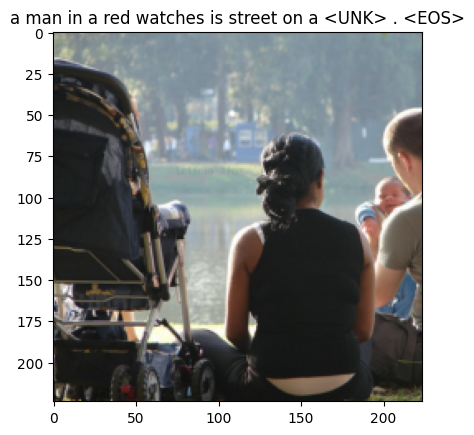

Epoch: 1 Batch 340/8095 loss: 4.77090


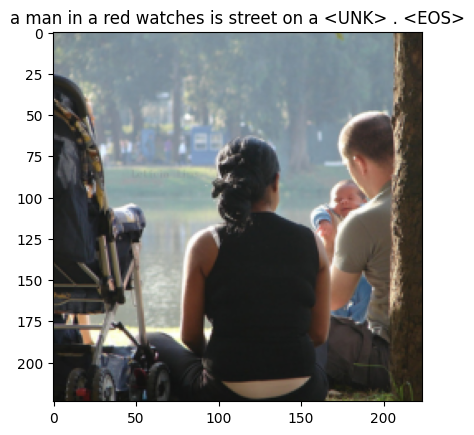

Epoch: 1 Batch 350/8095 loss: 4.74832


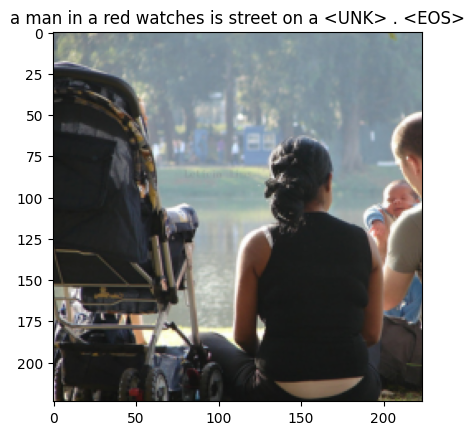

Epoch: 1 Batch 360/8095 loss: 7.06362


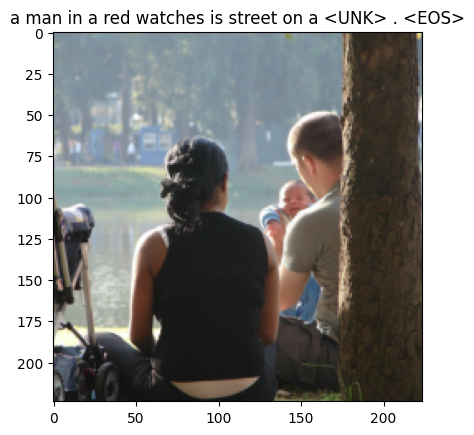

Epoch: 1 Batch 370/8095 loss: 5.49469


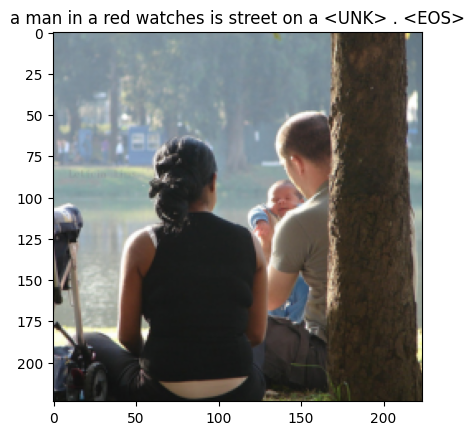

Epoch: 1 Batch 380/8095 loss: 5.21960


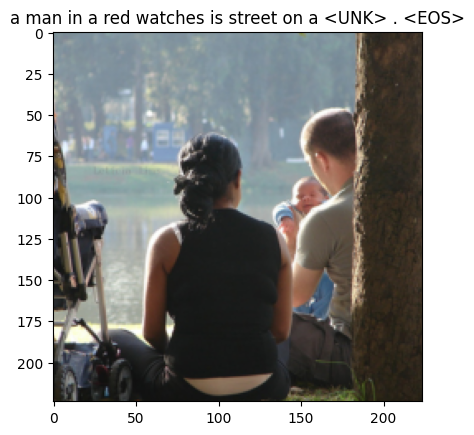

Epoch: 1 Batch 390/8095 loss: 6.24099


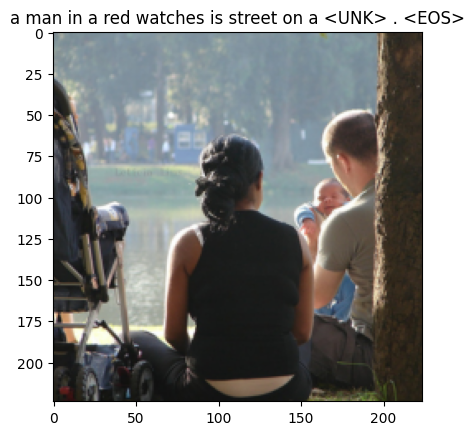

Epoch: 1 Batch 400/8095 loss: 5.03813


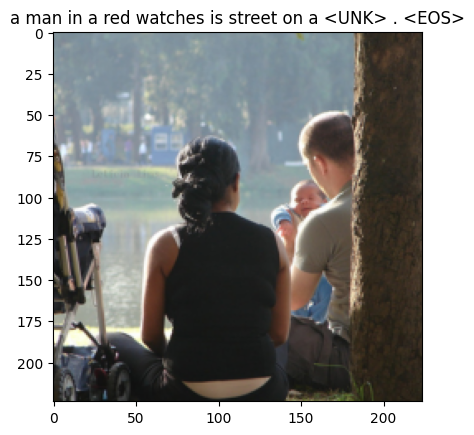

Epoch: 1 Batch 410/8095 loss: 4.96509


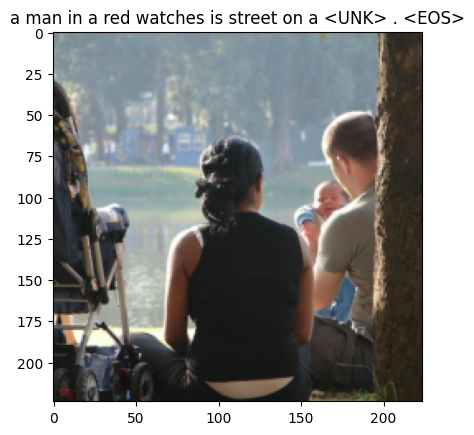

Epoch: 1 Batch 420/8095 loss: 5.51230


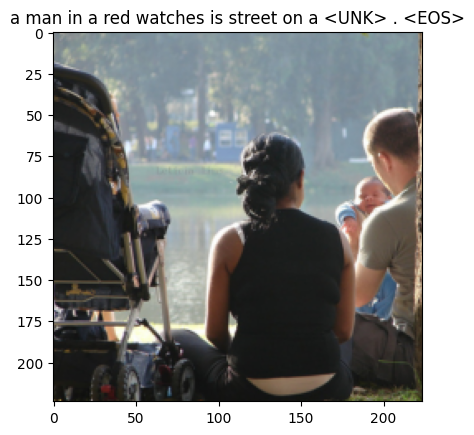

Epoch: 1 Batch 430/8095 loss: 3.71029


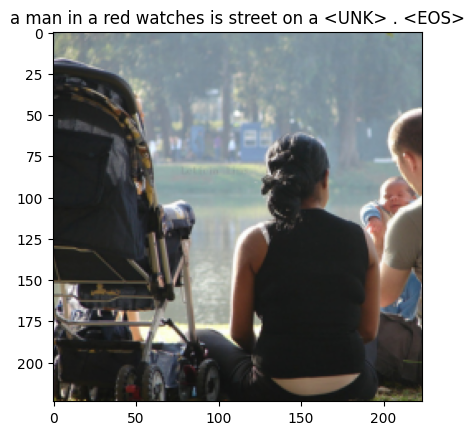

Epoch: 1 Batch 440/8095 loss: 4.86746


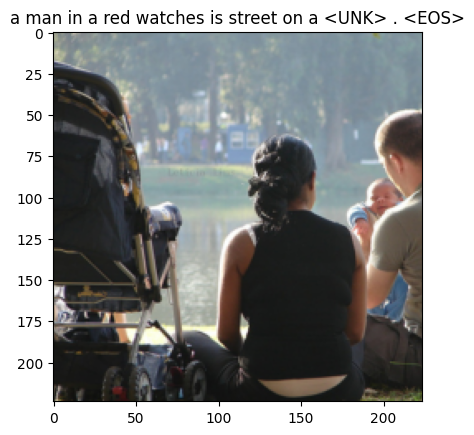

Epoch: 1 Batch 450/8095 loss: 5.67952


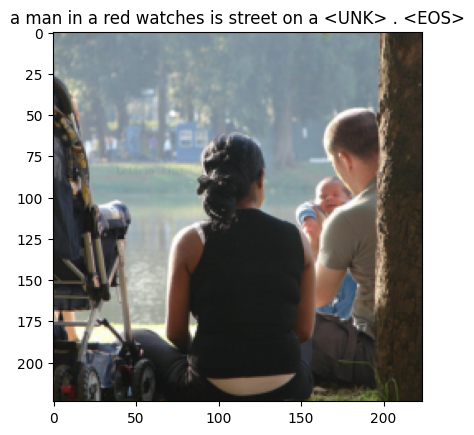

Epoch: 1 Batch 460/8095 loss: 5.32735


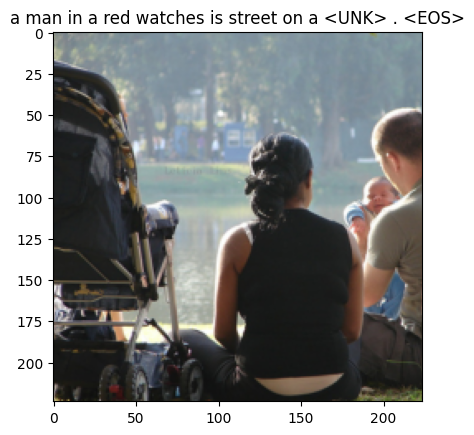

Epoch: 1 Batch 470/8095 loss: 4.54039


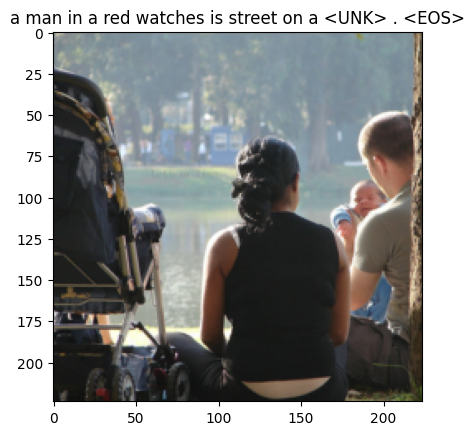

Epoch: 1 Batch 480/8095 loss: 4.53959


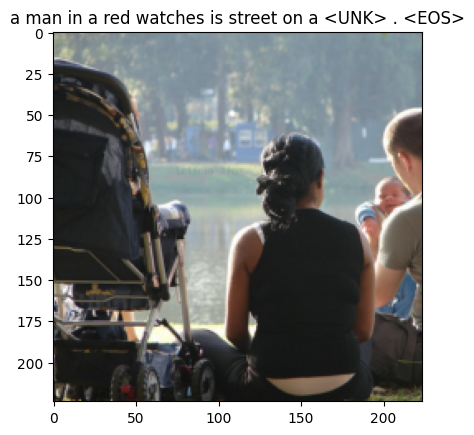

Epoch: 1 Batch 490/8095 loss: 5.28139


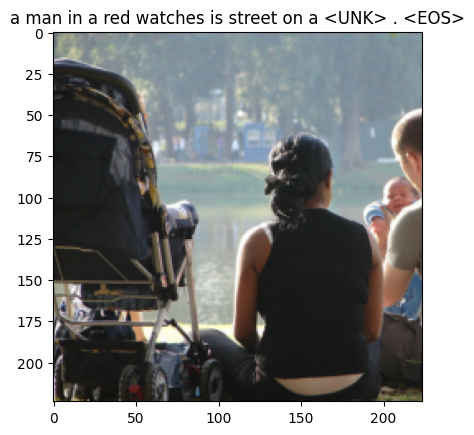

Epoch: 1 Batch 500/8095 loss: 5.09612


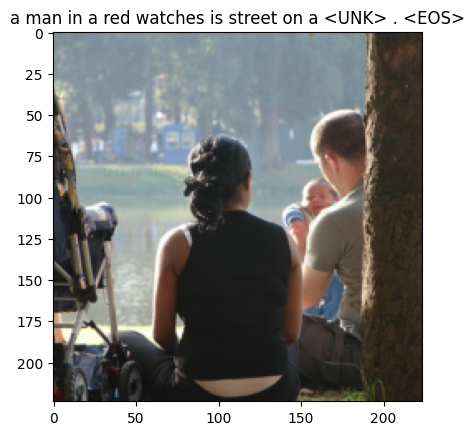

Epoch: 1 Batch 510/8095 loss: 4.62535


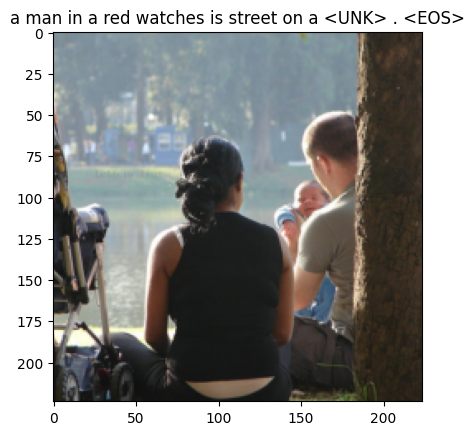

Epoch: 1 Batch 520/8095 loss: 5.79158


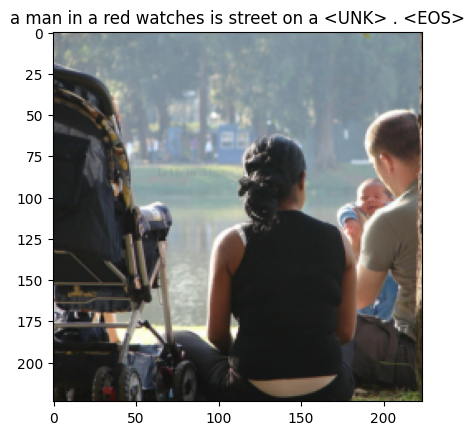

Epoch: 1 Batch 530/8095 loss: 5.79816


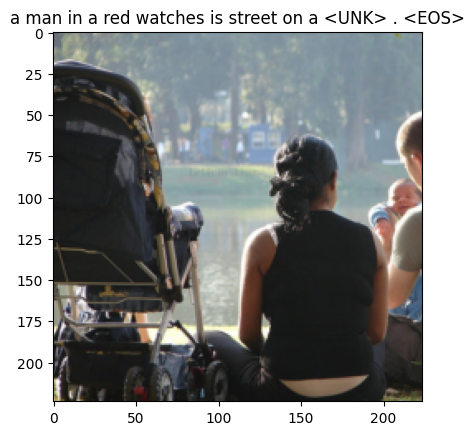

Epoch: 1 Batch 540/8095 loss: 4.88414


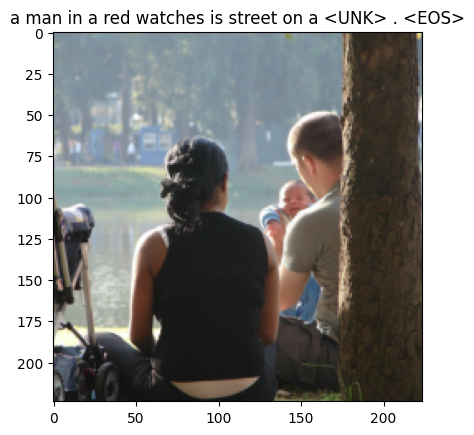

Epoch: 1 Batch 550/8095 loss: 5.06587


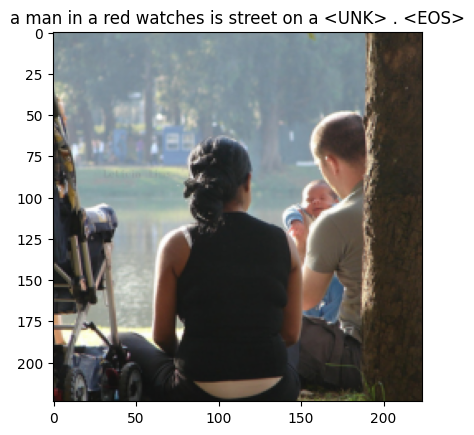

Epoch: 1 Batch 560/8095 loss: 4.35576


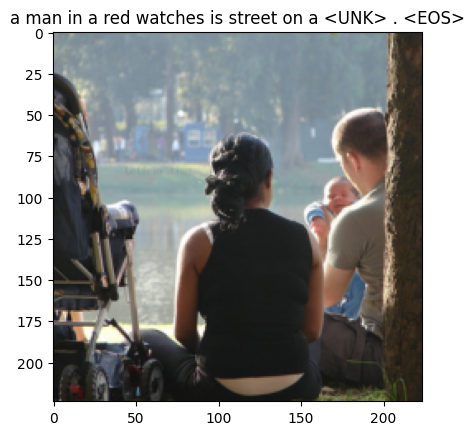

Epoch: 1 Batch 570/8095 loss: 5.72916


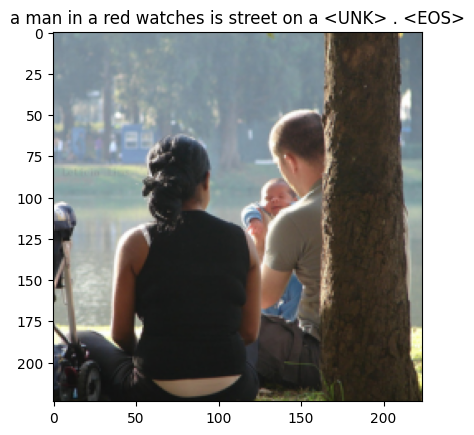

Epoch: 1 Batch 580/8095 loss: 6.30646


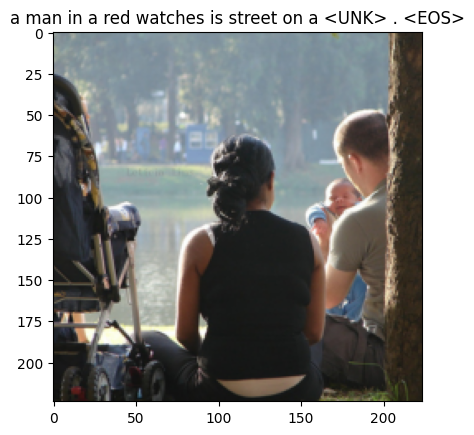

Epoch: 1 Batch 590/8095 loss: 5.27046


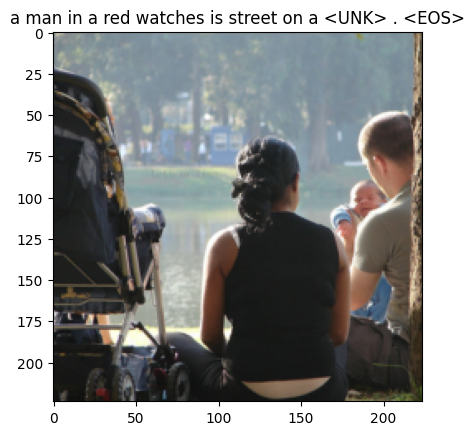

Epoch: 1 Batch 600/8095 loss: 5.19720


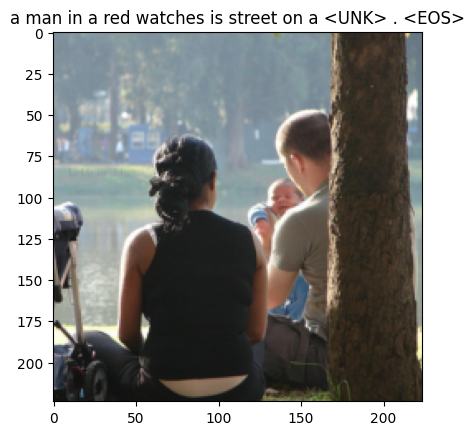

Epoch: 1 Batch 610/8095 loss: 4.67275


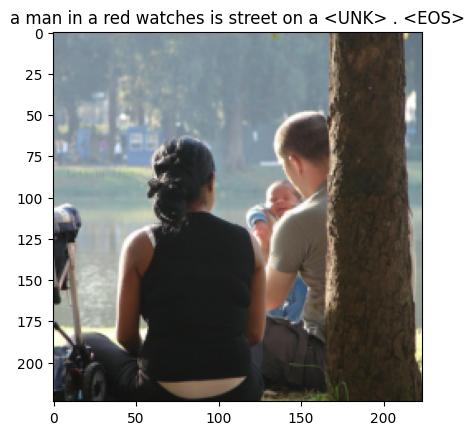

Epoch: 1 Batch 620/8095 loss: 5.26405


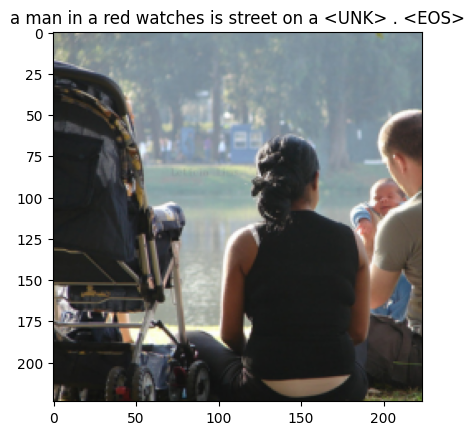

Epoch: 1 Batch 630/8095 loss: 6.27262


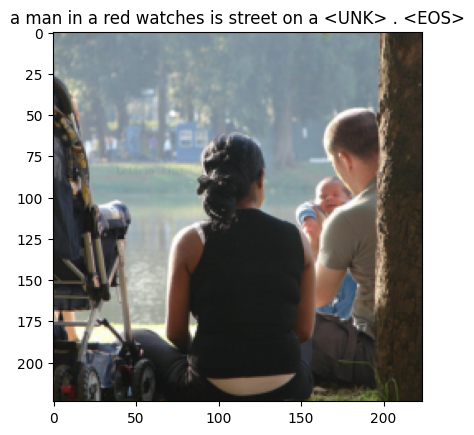

Epoch: 1 Batch 640/8095 loss: 4.88537


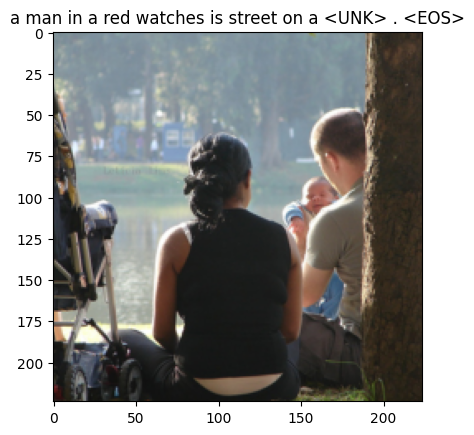

Epoch: 1 Batch 650/8095 loss: 7.07568


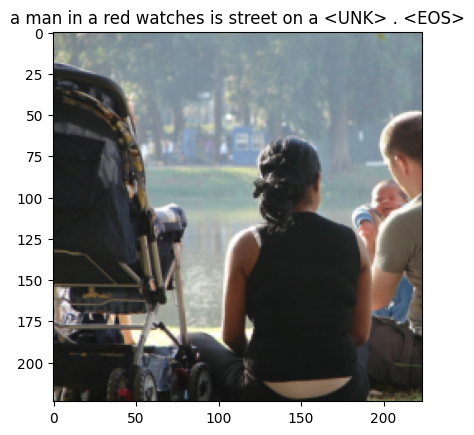

Epoch: 1 Batch 660/8095 loss: 4.69151


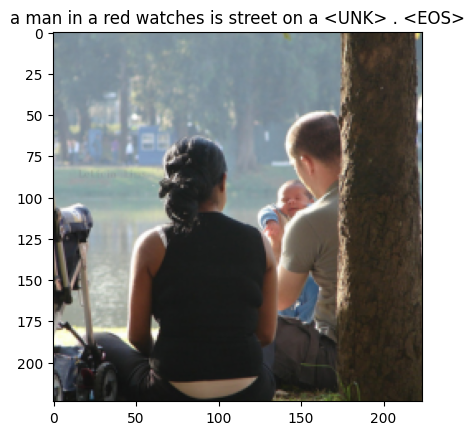

Epoch: 1 Batch 670/8095 loss: 5.96470


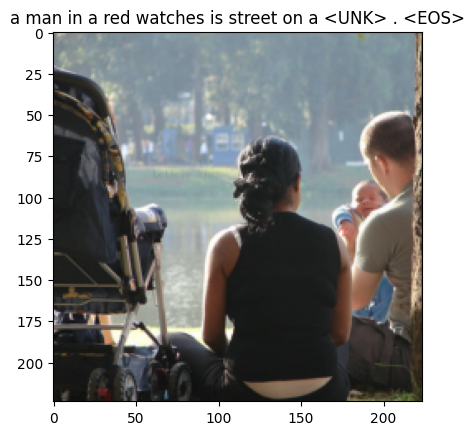

In [ ]:
# Use Validation Dataset

num_epochs = 2
print_every = 10

# Track losses for visualization
epoch_losses = []

# Change to validation dataset
data_loader = DataLoader(
  dataset=val_dataset,  # Use the validation dataset
  batch_size=1,
  num_workers=1,
  shuffle=False,  # No need to shuffle during validation
  collate_fn=CapsCollate(pad_idx=pad_idx, batch_first=True)
)

for epoch in range(1, num_epochs + 1):

    total_loss = 0

    # Set model to evaluation mode
    model.eval()

    for idx, (image, captions) in enumerate(iter(data_loader)):
        image, captions = image.to(device), captions.to(device)

        # Feed forward
        outputs, attentions = model(image, captions)

        # Calculate the batch loss
        targets = captions[:, 1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

        # Add the current loss to the total
        total_loss += loss.item()

        if (idx + 1) % print_every == 0:
            print(f"Epoch: {epoch} Batch {idx + 1}/{len(data_loader)} loss: {loss.item():.5f}")

            # Generate the caption for the current validation image
            with torch.no_grad():
                features = model.encoder(img[0:1].to(device))
                caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0], title=caption)

    # Compute average loss for this epoch
    avg_loss = total_loss / len(data_loader)
    epoch_losses.append((epoch, avg_loss))

    print(f"Epoch {epoch} Average Validation Loss: {avg_loss:.5f}")

## Visualizing Attention

In [ ]:
#generate caption

# alphas get the weight between the attention between image and caption embeddings.
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)

    return caps,alphas

#Show attention
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)

        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())


    plt.tight_layout()
    plt.show()

#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)